/neurospin/dico/babdelghani/Runs/02_champollion_v1/Program/2023_jlaval_STSbabies/contrastive/contrastive_env/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/neurospin/dico/babdelghani/Runs/02_champollion_v1/Program/2023_jlaval_STSbabies/contrastive/contrastive_env/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/neurospin/dico/babdelghani/Runs/02_champollion_v1/Program/2023_jlaval_STSbabies/contrastive/contrastive_env/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/neurospin/dico/babdelghani/Runs/02_champollion_v1/Program/2023_jlaval_STSbabies/contrastive/contrastive_env/lib/python3.12/site-packages/umap/umap_.p

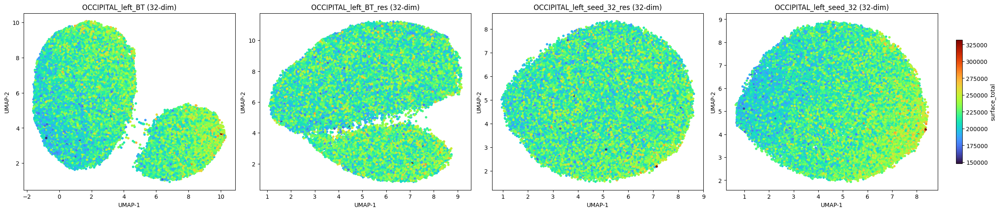

/neurospin/dico/babdelghani/Runs/02_champollion_v1/Program/2023_jlaval_STSbabies/contrastive/contrastive_env/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/neurospin/dico/babdelghani/Runs/02_champollion_v1/Program/2023_jlaval_STSbabies/contrastive/contrastive_env/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/neurospin/dico/babdelghani/Runs/02_champollion_v1/Program/2023_jlaval_STSbabies/contrastive/contrastive_env/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/neurospin/dico/babdelghani/Runs/02_champollion_v1/Program/2023_jlaval_STSbabies/contrastive/contrastive_env/lib/python3.12/site-packages/umap/umap_.p

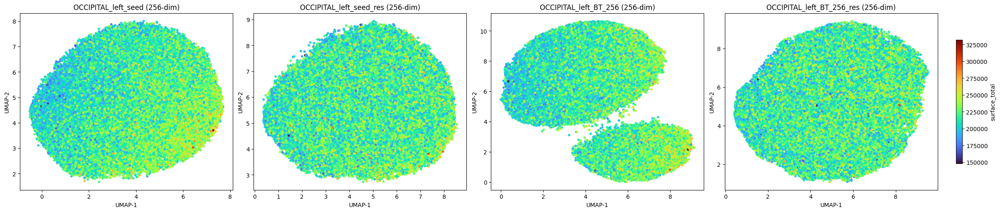

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import umap
import os
from sklearn.preprocessing import StandardScaler

# Define paths
base_path = "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Output/surface_embeddings"
folders_32 = ["OCCIPITAL_left_BT", "OCCIPITAL_left_BT_res", "OCCIPITAL_left_seed_32_res", "OCCIPITAL_left_seed_32"]
folders_256 = ["OCCIPITAL_left_seed", "OCCIPITAL_left_seed_res", "OCCIPITAL_left_BT_256", "OCCIPITAL_left_BT_256_res"]

# Load metadata
metadata_path = "/neurospin/dico/data/deep_folding/current/datasets/UkBioBank40/thickness_surface_Age.csv"
metadata_df = pd.read_csv(metadata_path).set_index("participant_id")

def load_first_seed_embeddings(folder_name):
    folder_path = os.path.join(base_path, folder_name)
    files = sorted(f for f in os.listdir(folder_path) if f.endswith('_0.csv'))
    if not files:
        raise FileNotFoundError(f"No '_0.csv' file found in {folder_path}")
    return pd.read_csv(os.path.join(folder_path, files[0]), index_col=0)

def compute_global_min_max(all_folders):
    min_val, max_val = np.inf, -np.inf
    for folder in all_folders:
        emb = load_first_seed_embeddings(folder)
        emb = emb.loc[metadata_df.index.intersection(emb.index)]
        surface = metadata_df.loc[emb.index]["surface_total"]
        min_val = min(min_val, surface.min())
        max_val = max(max_val, surface.max())
    return min_val, max_val

def plot_umap_comparison(folders, title_suffix, global_min, global_max, cmap='turbo'):# Try also: 'inferno', 'viridis', 'cividis'
    fig, axs = plt.subplots(1, len(folders), figsize=(6 * len(folders), 5), constrained_layout=True)
    for i, folder in enumerate(folders):
        emb = load_first_seed_embeddings(folder)
        emb = emb.loc[metadata_df.index.intersection(emb.index)]
        surface = metadata_df.loc[emb.index]["surface_total"]

        emb_scaled = StandardScaler().fit_transform(emb)
        reducer = umap.UMAP(random_state=42)
        emb_umap = reducer.fit_transform(emb_scaled)

        sc = axs[i].scatter(
            emb_umap[:, 0], emb_umap[:, 1],
            c=surface, cmap=cmap,
            vmin=global_min, vmax=global_max, s=10
        )
        axs[i].set_title(folder + title_suffix)
        axs[i].set_xlabel("UMAP-1")
        axs[i].set_ylabel("UMAP-2")

    cbar = fig.colorbar(sc, ax=axs.ravel().tolist(), shrink=0.7, pad=0.02)
    cbar.set_label('surface_total')
    plt.show()

# Main run
all_folders = folders_32 + folders_256
global_min, global_max = compute_global_min_max(all_folders)

plot_umap_comparison(folders_32, " (32-dim)", global_min, global_max)
plot_umap_comparison(folders_256, " (256-dim)", global_min, global_max)


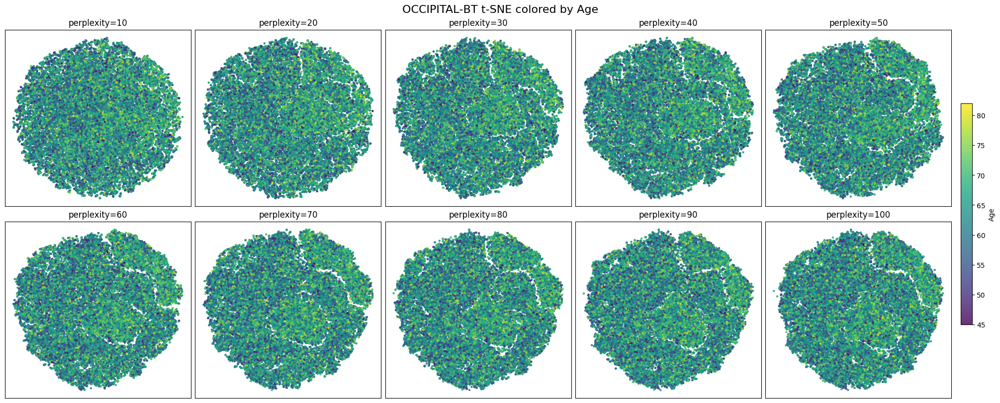

In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

# === 1) Load the 32‑D embeddings ===
emb_path = "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Output/2025-07-28/14-28-05_105/ukb40_FCLp_no_classiffier_random_embeddings/full_embeddings.csv"
emb = pd.read_csv(emb_path, index_col=0).astype(float)
emb.index = emb.index.astype(str)

# === 2) Load participant ages ===
age_csv = "/neurospin/dico/data/deep_folding/current/datasets/UkBioBank40/log_thickness_surface_Age.csv"
participants = pd.read_csv(age_csv, index_col=0)
participants.index = participants.index.astype(str)

# === 3) Align embeddings with age labels ===
common = emb.index.intersection(participants.index)
emb   = emb.loc[common]
ages  = participants.loc[common, "Age"].astype(float)

# === 4) Scale embeddings ===
X = StandardScaler().fit_transform(emb.values)

# === 5) Run t‑SNE across perplexities 10 to 100 and plot inline ===
perplexities = list(range(10, 101, 10))
n = len(perplexities)
cols = 5
rows = (n + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 4*rows), constrained_layout=True)

for ax, perp in zip(axes.flatten(), perplexities):
    tsne = TSNE(
        n_components=2,
        perplexity=perp,
        early_exaggeration=12.0,
        learning_rate=200,
        init="pca",
        random_state=42,
    )
    proj = tsne.fit_transform(X)
    sc = ax.scatter(
        proj[:,0], proj[:,1],
        c=ages, cmap="viridis",
        s=5, alpha=0.8
    )
    ax.set_title(f"perplexity={perp}")
    ax.set_xticks([])
    ax.set_yticks([])

# Hide extra axes
for ax in axes.flatten()[n:]:
    ax.set_visible(False)

# Add a shared colorbar for age
fig.colorbar(sc, ax=axes.ravel().tolist(), shrink=0.6, pad=0.01, label="Age")

plt.suptitle("OCCIPITAL‑BT t‑SNE colored by Age", fontsize=16)
plt.show()


In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

# === 1) Load the 32-D embeddings ===
emb_path = "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Output/2025-07-28/14-28-05_105/ukb40_FCLp_no_classiffier_random_embeddings/full_embeddings.csv"
emb = pd.read_csv(emb_path, index_col=0).astype(float)
emb.index = emb.index.astype(str)

# === 2) Load participant ages ===
age_csv = "/neurospin/dico/data/deep_folding/current/datasets/UkBioBank40/log_thickness_surface_Age.csv"
participants = pd.read_csv(age_csv, index_col=0)
participants.index = participants.index.astype(str)

# === 3) Align embeddings with age labels ===
common = emb.index.intersection(participants.index)
emb   = emb.loc[common]
ages  = participants.loc[common, "Age"].astype(float)

# === 4) Scale embeddings ===
X = StandardScaler().fit_transform(emb.values)

# === 5) Single t-SNE at perplexity 50 ===
perp = 50
tsne = TSNE(
    n_components=2,
    perplexity=perp,
    early_exaggeration=12.0,
    learning_rate=200,
    init="pca",
    random_state=42,
)
proj = tsne.fit_transform(X)

# === 6) Plot ===
fig, ax = plt.subplots(figsize=(6, 5), constrained_layout=True)
sc = ax.scatter(proj[:, 0], proj[:, 1], c=ages, cmap="viridis", s=5, alpha=0.8)
ax.set_title(f"OCCIPITAL-BT t-SNE (perplexity={perp})")
ax.set_xticks([]); ax.set_yticks([])
cbar = fig.colorbar(sc, ax=ax, shrink=0.8, pad=0.02, label="Age")
plt.show()


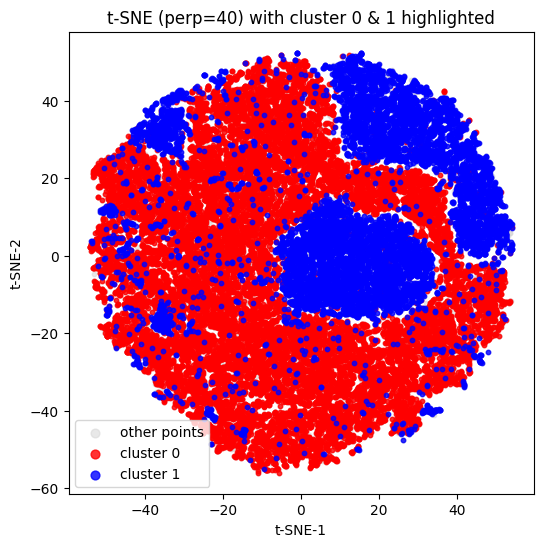

In [6]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# ——————————————————————————————————————————————————
# 1) Load embeddings & ages (same as before)
# ——————————————————————————————————————————————————
emb_path = (
    "/neurospin/dico/babdelghani/"
    "Runs/02_champollion_v1/Output/2025-07-28/"
    "14-28-05_105/ukb40_FCLp_no_classiffier_random_embeddings/"
    "full_embeddings.csv"
)
age_csv = "/neurospin/dico/data/deep_folding/current/datasets/UkBioBank40/log_thickness_surface_Age.csv"

emb = pd.read_csv(emb_path, index_col=0).astype(float)
emb.index = emb.index.astype(str)

participants = pd.read_csv(age_csv, index_col=0)
participants.index = participants.index.astype(str)

common = emb.index.intersection(participants.index)
emb = emb.loc[common]
ages = participants.loc[common, "Age"].astype(float)

X = StandardScaler().fit_transform(emb.values)

# ——————————————————————————————————————————————————
# 2) Read your two cluster‐txt files into sets
# ——————————————————————————————————————————————————
base_txt = "/home/cb283697/Téléchargements"
cluster0_ids = set(open(os.path.join(base_txt, "OCCIPITAL_left_BT_seed_1.csv_cluster_0.txt")).read().splitlines())
cluster1_ids = set(open(os.path.join(base_txt, "OCCIPITAL_left_BT_seed_1.csv_cluster_1.txt")).read().splitlines())

# ——————————————————————————————————————————————————
# 3) Run t‑SNE (pick one perplexity)
# ——————————————————————————————————————————————————
perp = 40
tsne = TSNE(
    n_components=2,
    perplexity=perp,
    early_exaggeration=12.0,
    learning_rate=200,
    init="pca",
    random_state=42,
)
proj = tsne.fit_transform(X)

# ——————————————————————————————————————————————————
# 4) Build DataFrame & annotate membership
# ——————————————————————————————————————————————————
df = pd.DataFrame({
    "tSNE1":      proj[:, 0],
    "tSNE2":      proj[:, 1],
    "subject_id": emb.index,
})
df["cluster0"] = df["subject_id"].isin(cluster0_ids)
df["cluster1"] = df["subject_id"].isin(cluster1_ids)

# ——————————————————————————————————————————————————
# 5) Plot: gray background + two highlights
# ——————————————————————————————————————————————————
plt.figure(figsize=(6, 6))
# plot everyone in light gray
plt.scatter(df["tSNE1"], df["tSNE2"],
            color="lightgray", s=10, alpha=0.5, label="other points")

# overlay cluster0 in red
mask0 = df["cluster0"]
plt.scatter(df.loc[mask0, "tSNE1"], df.loc[mask0, "tSNE2"],
            color="red", s=10, alpha=0.8, label="cluster 0")

# overlay cluster1 in blue
mask1 = df["cluster1"]
plt.scatter(df.loc[mask1, "tSNE1"], df.loc[mask1, "tSNE2"],
            color="blue", s=10, alpha=0.8, label="cluster 1")

plt.title(f"t‑SNE (perp={perp}) with cluster 0 & 1 highlighted")
plt.xlabel("t‑SNE‑1")
plt.ylabel("t‑SNE‑2")
plt.legend(markerscale=2)
plt.show()


In [20]:
import os
import pandas as pd

# === 1) Paths to your cluster txt files ===
base_txt = "/home/cb283697/Téléchargements"
cluster0_ids = set(open(os.path.join(base_txt,
    "OCCIPITAL_left_BT_seed_1.csv_cluster_0.txt")).read().splitlines())
cluster1_ids = set(open(os.path.join(base_txt,
    "OCCIPITAL_left_BT_seed_1.csv_cluster_1.txt")).read().splitlines())

# === 2) Load the sex+age table ===
participants_csv = "/neurospin/dico/data/deep_folding/current/datasets/UkBioBank40/participants_sex_age.csv"
parts = pd.read_csv(participants_csv, dtype=str)

# Rename for convenience
parts = parts.rename(columns={"Subject":"subject_id", "Sex":"sex", "Age":"age"})
parts["age"] = parts["age"].astype(float)

# === 3) Filter to cluster members ===
df0 = parts[parts["subject_id"].isin(cluster0_ids)].copy()
df1 = parts[parts["subject_id"].isin(cluster1_ids)].copy()

print(f"Found {len(df0)} participants in cluster 0")
print(f"Found {len(df1)} participants in cluster 1")

# === 4) Pick extremes ===
df0_oldest = df0.sort_values("age", ascending=False).head(250)
df1_young  = df1.sort_values("age", ascending=True).head(250)

# === 5) Write out subject lists ===
out_dir = "selected_cluster_subjects"
os.makedirs(out_dir, exist_ok=True)

file0 = os.path.join(out_dir, "cluster0_oldest_250.txt")
file1 = os.path.join(out_dir, "cluster1_youngest_250.txt")

df0_oldest["subject_id"].to_csv(file0, index=False, header=False)
df1_young["subject_id"].to_csv(file1, index=False, header=False)

print(f"250 oldest from cluster0 → {file0}")
print(f"250 youngest from cluster1 → {file1}")

# === 6) Combined CSV with metadata ===
combined = pd.concat([
    df0_oldest.assign(group="cluster0_oldest"),
    df1_young.assign (group="cluster1_youngest")
], ignore_index=True)

combined_csv = os.path.join(out_dir, "cluster0_1_selected_subjects.csv")
combined.to_csv(combined_csv, index=False)
print(f"Combined CSV → {combined_csv}")


Found 23274 participants in cluster 0
Found 9982 participants in cluster 1
250 oldest from cluster0 → selected_cluster_subjects/cluster0_oldest_250.txt
250 youngest from cluster1 → selected_cluster_subjects/cluster1_youngest_250.txt
Combined CSV → selected_cluster_subjects/cluster0_1_selected_subjects.csv


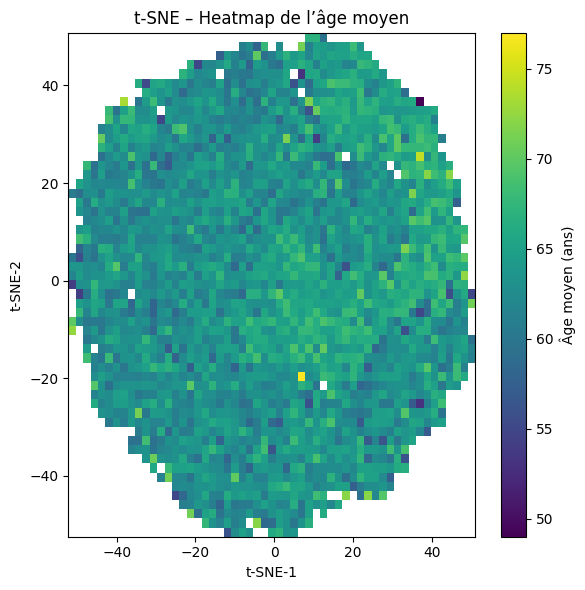

In [38]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import binned_statistic_2d
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

# 1) Chargement embeddings & âges
emb_path = (
    "/neurospin/dico/babdelghani/"
    "Runs/02_champollion_v1/Output/2025-07-28/"
    "14-28-05_105/ukb40_FCLp_no_classiffier_random_embeddings/"
    "full_embeddings.csv"
)
age_csv = "/neurospin/dico/data/deep_folding/current/datasets/UkBioBank40/log_thickness_surface_Age.csv"

emb = pd.read_csv(emb_path, index_col=0).astype(float)
emb.index = emb.index.astype(str)
parts = pd.read_csv(age_csv, index_col=0)
parts.index = parts.index.astype(str)

common = emb.index.intersection(parts.index)
emb  = emb.loc[common]
ages = parts.loc[common, "Age"].astype(float)

# 2) Standardisation & t-SNE
X = StandardScaler().fit_transform(emb.values)
tsne = TSNE(n_components=2, perplexity=50, early_exaggeration=12.0,
            learning_rate=200, init="pca", random_state=42)
proj = tsne.fit_transform(X)
x, y = proj[:,0], proj[:,1]

# 3) Calcul de l’âge moyen par cellule de la grille
n_bins = 55
stat, x_edges, y_edges, _ = binned_statistic_2d(
    x, y, ages,
    statistic='mean',
    bins=[n_bins, n_bins]
)

# 4) Affichage de la heatmap d’âge moyen
fig, ax = plt.subplots(figsize=(6,6))
# pcolormesh attend la matrice transposée pour que l'axe y soit orienté "vers le haut"
mesh = ax.pcolormesh(
    x_edges, y_edges, stat.T,
    cmap="viridis",
    shading="auto"
)
cbar = fig.colorbar(mesh, ax=ax)
cbar.set_label("Âge moyen (ans)")

ax.set_xlabel("t-SNE-1")
ax.set_ylabel("t-SNE-2")
ax.set_title("t-SNE – Heatmap de l’âge moyen")
plt.tight_layout()
plt.show()


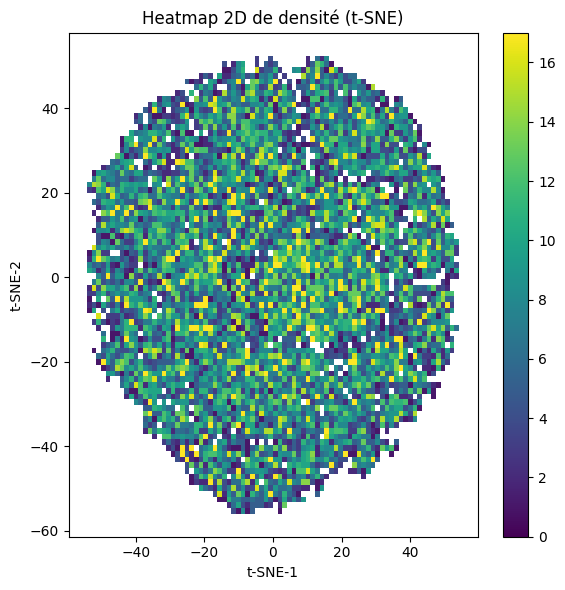

In [36]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
import seaborn as sns

# === Paths & chargement (inchangé) ===
emb_path = (
    "/neurospin/dico/babdelghani/"
    "Runs/02_champollion_v1/Output/2025-07-28/"
    "14-28-05_105/ukb40_FCLp_no_classiffier_random_embeddings/"
    "full_embeddings.csv"
)
age_csv = "/neurospin/dico/data/deep_folding/current/datasets/UkBioBank40/log_thickness_surface_Age.csv"

emb = pd.read_csv(emb_path, index_col=0).astype(float)
emb.index = emb.index.astype(str)
parts = pd.read_csv(age_csv, index_col=0)
parts.index = parts.index.astype(str)

common = emb.index.intersection(parts.index)
emb  = emb.loc[common]
ages = parts.loc[common, "Age"].astype(float)

# === Standardisation & t-SNE ===
X = StandardScaler().fit_transform(emb.values)
tsne = TSNE(
    n_components=2,
    perplexity=40,
    early_exaggeration=12.0,
    learning_rate=200,
    init="pca",
    random_state=42
)
coords = tsne.fit_transform(X)
x, y = coords[:,0], coords[:,1]

# === Heatmap 2D de densité sur t-SNE ===
fig, ax = plt.subplots(figsize=(6,6))

sns.histplot(
    x=x, y=y,
    bins=80,        # résolution de la grille
    pmax=0.9,       # écrête la colorbar aux 90 % des counts
    cbar=True,      # affiche la colorbar
    cmap="viridis", # palette viridis
    ax=ax
)

ax.set_xlabel("t-SNE-1")
ax.set_ylabel("t-SNE-2")
ax.set_title("Heatmap 2D de densité (t-SNE)")
plt.tight_layout()
plt.show()


/neurospin/dico/babdelghani/Runs/02_champollion_v1/Program/2023_jlaval_STSbabies/contrastive/contrastive_env/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/neurospin/dico/babdelghani/Runs/02_champollion_v1/Program/2023_jlaval_STSbabies/contrastive/contrastive_env/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


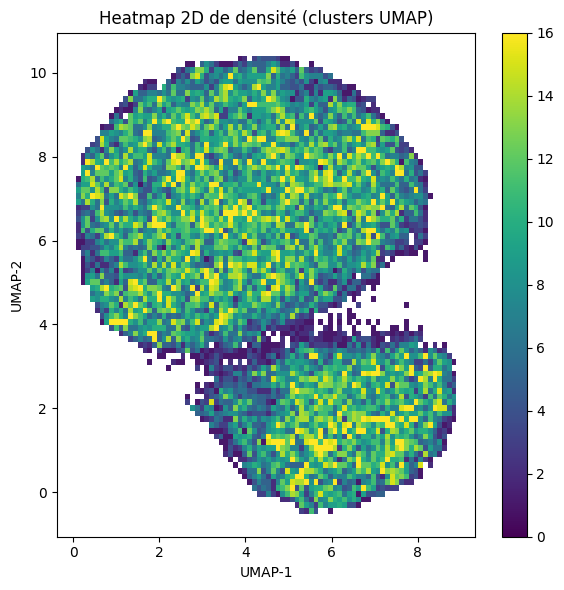

In [35]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from umap import UMAP
from sklearn.preprocessing import StandardScaler
import seaborn as sns

# === Paths & chargement (inchangé) ===
emb_path = (
    "/neurospin/dico/babdelghani/"
    "Runs/02_champollion_v1/Output/2025-07-28/"
    "14-28-05_105/ukb40_FCLp_no_classiffier_random_embeddings/"
    "full_embeddings.csv"
)
age_csv = "/neurospin/dico/data/deep_folding/current/datasets/UkBioBank40/log_thickness_surface_Age.csv"

emb = pd.read_csv(emb_path, index_col=0).astype(float)
emb.index = emb.index.astype(str)
parts = pd.read_csv(age_csv, index_col=0)
parts.index = parts.index.astype(str)

common = emb.index.intersection(parts.index)
emb  = emb.loc[common]
ages = parts.loc[common, "Age"].astype(float)

# === Standardisation & UMAP (inchangé) ===
X = StandardScaler().fit_transform(emb.values)
reducer = UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
coords  = reducer.fit_transform(X)
x, y = coords[:,0], coords[:,1]

# === Heatmap 2D de densité ===
fig, ax = plt.subplots(figsize=(6,6))

# seaborn.histplot en 2D pour une heatmap
sns.histplot(
    x=x, y=y,
    bins=80,        # résolution de la grille
    pmax=0.9,       # max pour la barre de couleur (écrête les valeurs extrêmes)
    cbar=True,      # affiche la colorbar
    cmap="viridis", # palette
    ax=ax
)

ax.set_xlabel("UMAP-1")
ax.set_ylabel("UMAP-2")
ax.set_title("Heatmap 2D de densité (clusters UMAP)")
plt.tight_layout()
plt.show()


In [17]:
import pandas as pd

# Path to your CSV
path = "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Program/2023_jlaval_STSbabies/abdelghani_scripts/selected_cluster_subjects/cluster0_1_selected_subjects.csv"

# 1) Load
df = pd.read_csv(path)

# 2) Drop rows where `cluster` is NaN
df_clean = df.dropna(subset=["cluster"])

# 3) Cast to integer
df_clean["cluster"] = df_clean["cluster"].astype(int)

# 4) Save back (overwrite) or to a new file
df_clean.to_csv(path, index=False)
# Or to a new file:
# df_clean.to_csv(path.replace(".csv","_cleaned.csv"), index=False)


In [19]:
import pandas as pd

# 1) Load the CSV (use the exact full path where your file lives)
csv_path = "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Program/2023_jlaval_STSbabies/abdelghani_scripts/selected_cluster_subjects/cluster0_1_selected_subjects.csv"
df = pd.read_csv(csv_path, dtype=str)

# 2) Keep only the two wanted labels, drop any others
df = df[df["group"].isin(["cluster0_oldest", "cluster1_youngest"])].copy()

# 3) Map text → numeric and rename the column to 'cluster'
df["cluster"] = df["group"].map({
    "cluster0_oldest": 0,
    "cluster1_youngest": 1
}).astype(int)
df = df.drop(columns="group")

# 4) Overwrite the CSV (or write a new one)
df.to_csv(csv_path, index=False)


KeyError: 'group'

VISUALIZATION UMAP ON THE METADATA

/neurospin/dico/babdelghani/Runs/02_champollion_v1/Program/2023_jlaval_STSbabies/contrastive/contrastive_env/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/neurospin/dico/babdelghani/Runs/02_champollion_v1/Program/2023_jlaval_STSbabies/contrastive/contrastive_env/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/tmp/ipykernel_3742172/4228758423.py:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


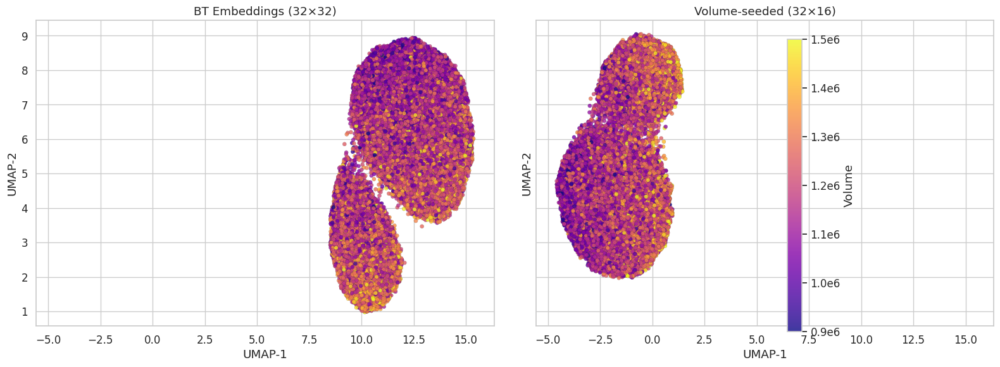

In [46]:
#!/usr/bin/env python3
import os
import pandas as pd
import umap
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

# ─── User-configurable paths ───────────────────────────────────────────────────────

emb1_csv = (
    "/neurospin/dico/babdelghani/Runs/02_champollion_v1/"
    "Output/BT/OCCIPITAL_left_32_32/batch_32_seed_128/"
    "2025-08-04/14-23-42_0/"
    "ukb40_FCLp_no_classiffier_random_embeddings/full_embeddings.csv"
)

emb2_csv = (
    "/neurospin/dico/babdelghani/Runs/02_champollion_v1/"
    "Output/volume_seed/OCCIPITAL_left_32_16/batch_16_seed_128/"
    "2025-08-06/15-50-12_0/"
    "ukb40_FCLp_no_classiffier_random_embeddings/full_embeddings.csv"
)

volumes_csv = (
    "/neurospin/dico/data/deep_folding/current/datasets/"
    "UkBioBank40/participants_sex_age_volumes.csv"
)

# ─── Load data ────────────────────────────────────────────────────────────────────

df1 = pd.read_csv(emb1_csv)
df2 = pd.read_csv(emb2_csv)
vol = pd.read_csv(volumes_csv)

# ─── Harmonize and merge ──────────────────────────────────────────────────────────

df1.rename(columns={df1.columns[0]: "ID"}, inplace=True)
df2.rename(columns={df2.columns[0]: "ID"}, inplace=True)
vol.rename(columns={"participant_id": "ID"}, inplace=True)

VOL_COL = "volume"
vol = vol[["ID", VOL_COL]]

df1 = df1.merge(vol, on="ID", how="inner")
df2 = df2.merge(vol, on="ID", how="inner")

# ─── UMAP reduction in shared space ───────────────────────────────────────────────

emb_cols = [c for c in df1.columns if c not in ("ID", VOL_COL)]
combined = pd.concat([df1, df2], ignore_index=True)

reducer = umap.UMAP(n_components=2, random_state=42)
coords = reducer.fit_transform(combined[emb_cols])
combined["UMAP1"], combined["UMAP2"] = coords.T

df1_plot = combined.iloc[: len(df1)].copy()
df2_plot = combined.iloc[len(df1):].copy()

# ─── Plotting ────────────────────────────────────────────────────────────────────

sns.set(style="whitegrid", font_scale=1.1)
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharex=True, sharey=True)

# fixed color range
vmin, vmax = 0.9e6, 1.5e6

for ax, df, title in zip(
    axes,
    [df1_plot, df2_plot],
    ["BT Embeddings (32×32)", "Volume-seeded (32×16)"]
):
    sc = ax.scatter(
        df["UMAP1"], df["UMAP2"],
        c=df[VOL_COL],
        cmap="plasma",
        vmin=vmin, vmax=vmax,
        s=20,
        edgecolor="k",
        linewidth=0.1,
        alpha=0.8
    )
    ax.set_title(title)
    ax.set_xlabel("UMAP-1")
    ax.set_ylabel("UMAP-2")

# shared colorbar
cbar = plt.colorbar(sc, ax=axes.tolist(), label="Volume")
# set ticks at 0.9,1.0,…,1.5 ×10⁶
ticks = [x * 1e5 for x in range(9, 16)]  # 0.9e6 to 1.5e6 in steps of 0.1e6
cbar.set_ticks(ticks)
cbar.ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f"{x/1e6:.1f}e6"))

plt.tight_layout()

plt.show()


Mahalanobis PCA EVR: PC1=0.19, PC2=0.16
Euclidean PCA EVR: PC1=0.14, PC2=0.12


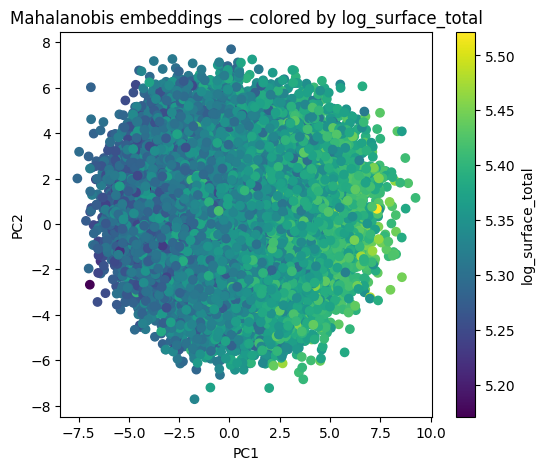

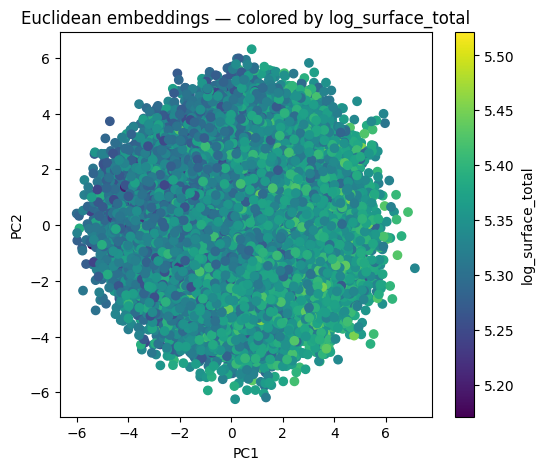

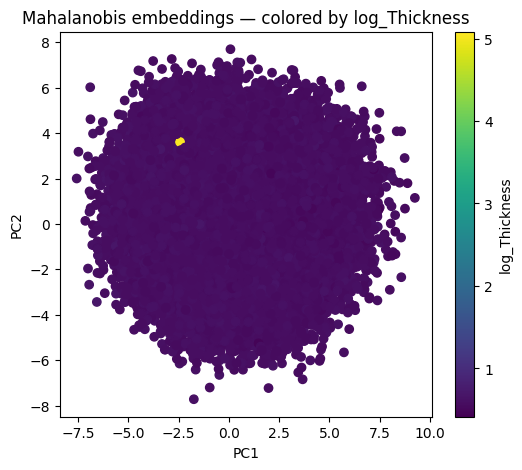

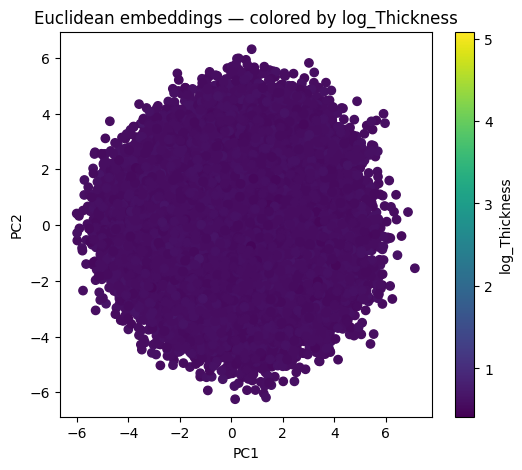

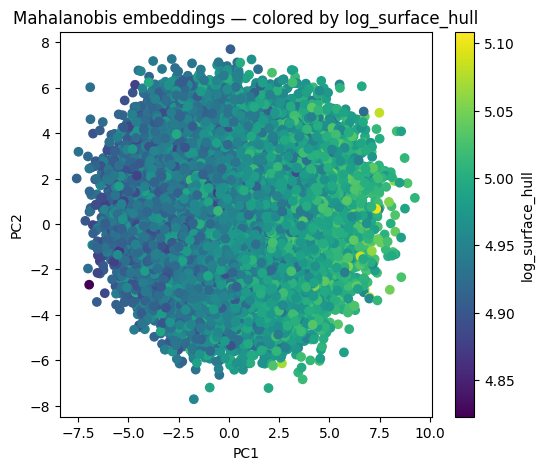

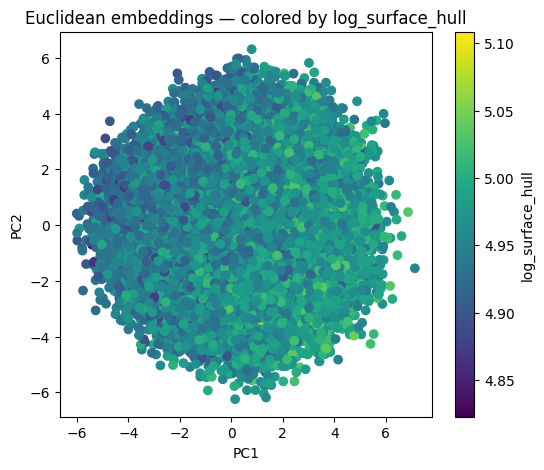

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# =========================
# Paths
# =========================
META_PATH = "/neurospin/dico/data/deep_folding/current/datasets/UkBioBank40/log_thickness_surface_Age.csv"

EMB_MAH_PATH = "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Output/surface/mahlonobis_16/OCCIPITAL_left_32_16/sigma_null_factor_1.2_batch_16/2025-08-03/19-01-53_0/ukb40_FCLp_no_classiffier_random_embeddings/full_embeddings.csv"

EMB_EUC_PATH = "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Output/surface/diagonal_16/OCCIPITAL_left_32_16/sigma_null_factor_1.2_batch_16/2025-08-02/18-27-08_0/ukb40_FCLp_no_classiffier_random_embeddings/full_embeddings.csv"

# If you know the subject ID column name, set it here, else leave None to guess
ID_COL = None  
META_COLS = ["log_surface_total", "log_Thickness", "log_surface_hull"]

# =========================
# Helpers
# =========================
def guess_id_col(df, explicit=None):
    if explicit and explicit in df.columns:
        return explicit
    candidates = ["ID", "Id", "id", "subject", "Subject", "SUBJECT", "eid", "participant_id"]
    for c in candidates:
        if c in df.columns:
            return c
    raise KeyError(f"Could not find ID column. Available: {list(df.columns)}")

def load_embeddings(path, id_col=None):
    emb = pd.read_csv(path)
    col_id = guess_id_col(emb, id_col)
    num_cols = [c for c in emb.columns if c != col_id and np.issubdtype(emb[c].dtype, np.number)]
    return emb[[col_id] + num_cols].rename(columns={col_id: "ID"})

def load_metadata(path, meta_cols, id_col=None):
    meta = pd.read_csv(path)
    col_id = guess_id_col(meta, id_col)
    return meta[[col_id] + meta_cols].rename(columns={col_id: "ID"})

def pca_on_embeddings(emb_df, n_components=2):
    X = emb_df.drop(columns=["ID"]).values
    Xs = StandardScaler().fit_transform(X)
    pca = PCA(n_components=n_components, random_state=0)
    Z = pca.fit_transform(Xs)
    pc_df = pd.DataFrame(Z, columns=[f"PC{i+1}" for i in range(n_components)])
    pc_df.insert(0, "ID", emb_df["ID"].values)
    return pc_df, pca.explained_variance_ratio_

def plot_pca(pc_df, meta_df, meta_col, title):
    merged = pc_df.merge(meta_df, on="ID", how="inner")
    fig, ax = plt.subplots(figsize=(6, 5))
    sc = ax.scatter(merged["PC1"], merged["PC2"], c=merged[meta_col], cmap="viridis")
    ax.set_xlabel("PC1")
    ax.set_ylabel("PC2")
    ax.set_title(f"{title} — colored by {meta_col}")
    cb = plt.colorbar(sc, ax=ax)
    cb.set_label(meta_col)
    plt.show()

# =========================
# Main analysis
# =========================
meta_df = load_metadata(META_PATH, META_COLS, ID_COL)
emb_mah_df = load_embeddings(EMB_MAH_PATH, ID_COL)
emb_euc_df = load_embeddings(EMB_EUC_PATH, ID_COL)

pc_mah_df, evr_mah = pca_on_embeddings(emb_mah_df)
pc_euc_df, evr_euc = pca_on_embeddings(emb_euc_df)

print(f"Mahalanobis PCA EVR: PC1={evr_mah[0]:.2f}, PC2={evr_mah[1]:.2f}")
print(f"Euclidean PCA EVR: PC1={evr_euc[0]:.2f}, PC2={evr_euc[1]:.2f}")

for meta_col in META_COLS:
    plot_pca(pc_mah_df, meta_df, meta_col, "Mahalanobis embeddings")
    plot_pca(pc_euc_df, meta_df, meta_col, "Euclidean embeddings")


Mahalanobis EVR: PC1=0.19, PC2=0.16
Euclidean   EVR: PC1=0.14, PC2=0.13
BarlowTwin  EVR: PC1=0.20, PC2=0.16


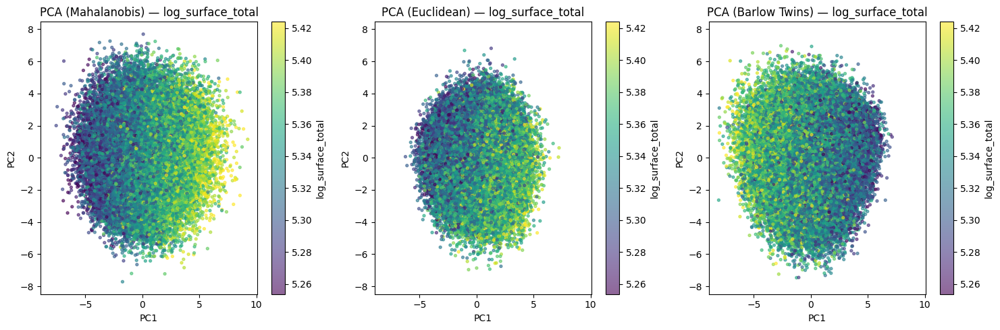

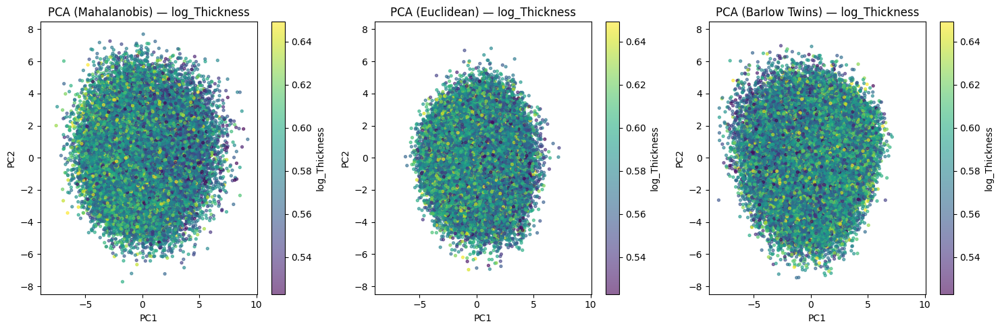

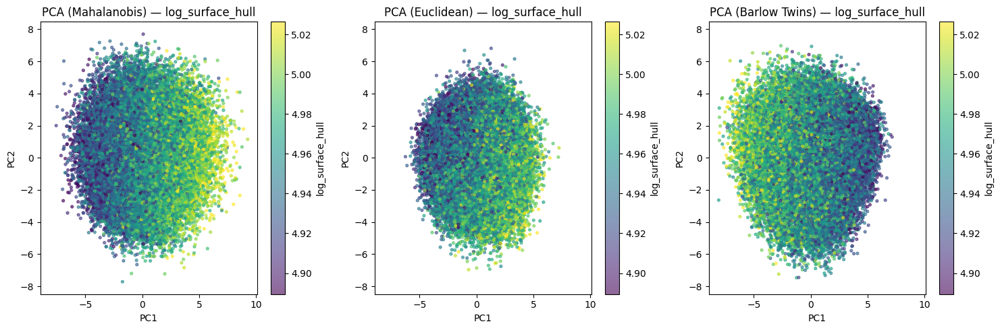

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# ========= Paths (edit if needed) =========
META_PATH = "/neurospin/dico/data/deep_folding/current/datasets/UkBioBank40/log_thickness_surface_Age.csv"
EMB_MAH_PATH = "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Output/surface/mahlonobis_16/OCCIPITAL_left_32_16/sigma_null_factor_1.2_batch_16/2025-08-03/19-01-53_0/ukb40_FCLp_no_classiffier_random_embeddings/full_embeddings.csv"
EMB_EUC_PATH = "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Output/surface/diagonal_16/OCCIPITAL_left_32_16/sigma_null_factor_1.0_batch_16/2025-08-02/18-27-08_0/ukb40_FCLp_no_classiffier_random_embeddings/full_embeddings.csv"
EMB_BT_PATH  = "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Output/BT/OCCIPITAL_left_32_32/batch_32_seed_128/2025-08-04/14-23-42_0/ukb40_FCLp_no_classiffier_random_embeddings/full_embeddings.csv"

META_COLS = ["log_surface_total", "log_Thickness", "log_surface_hull"]
ID_COL = None  # set to your exact ID column if you know it (e.g. "ID" or "eid")

# ========= Helpers =========
def guess_id_col(df, explicit=None):
    if explicit and explicit in df.columns:
        return explicit
    for c in ["ID","Id","id","subject","Subject","SUBJECT","eid","participant_id"]:
        if c in df.columns:
            return c
    raise KeyError(f"No ID column found. Available: {list(df.columns)}")

def load_embeddings(path, id_col=None):
    df = pd.read_csv(path)
    cid = guess_id_col(df, id_col)
    num_cols = [c for c in df.columns if c != cid and np.issubdtype(df[c].dtype, np.number)]
    return df[[cid] + num_cols].rename(columns={cid: "ID"})

def load_metadata(path, meta_cols, id_col=None):
    df = pd.read_csv(path)
    cid = guess_id_col(df, id_col)
    keep = [cid] + meta_cols
    missing = [c for c in meta_cols if c not in df.columns]
    if missing:
        raise KeyError(f"Missing {missing} in metadata. Available: {list(df.columns)}")
    return df[keep].rename(columns={cid: "ID"})

def pca2(emb):
    X = emb.drop(columns=["ID"]).values
    Xs = StandardScaler().fit_transform(X)
    p = PCA(n_components=2, random_state=0)
    Z = p.fit_transform(Xs)
    out = pd.DataFrame(Z, columns=["PC1","PC2"])
    out.insert(0, "ID", emb["ID"].values)
    return out, p.explained_variance_ratio_

def robust_limits(x, q_low=1, q_high=99):
    """Percentile-based limits to ignore extreme outliers."""
    vmin = np.nanpercentile(x, q_low)
    vmax = np.nanpercentile(x, q_high)
    if np.isclose(vmin, vmax):
        eps = 1e-6
        vmin, vmax = vmin - eps, vmax + eps
    return float(vmin), float(vmax)

# ========= New triple scatter =========
def triple_scatter(pc1, pc2, pc3, meta, meta_col,
                   titles=("Mahalanobis", "Euclidean", "Barlow Twins"),
                   s=8, alpha=0.6, cmap="viridis"):
    # merge on common IDs
    dfs = [pc.merge(meta, on="ID", how="inner") for pc in [pc1, pc2, pc3]]
    common = set(dfs[0]["ID"]) & set(dfs[1]["ID"]) & set(dfs[2]["ID"])
    dfs = [df[df["ID"].isin(common)].reset_index(drop=True) for df in dfs]

    vmin, vmax = robust_limits(dfs[0][meta_col].values)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    for ax, df, title in zip(axes, dfs, titles):
        sc = ax.scatter(df["PC1"], df["PC2"], c=np.clip(df[meta_col], vmin, vmax),
                        s=s, alpha=alpha, cmap=cmap, vmin=vmin, vmax=vmax)
        ax.set_xlabel("PC1")
        ax.set_ylabel("PC2")
        ax.set_title(f"PCA ({title}) — {meta_col}")
        cb = plt.colorbar(sc, ax=ax)
        cb.set_label(meta_col)

    # Shared axes
    x_all = np.concatenate([df["PC1"] for df in dfs])
    y_all = np.concatenate([df["PC2"] for df in dfs])
    xpad = 0.05 * (x_all.max() - x_all.min() + 1e-9)
    ypad = 0.05 * (y_all.max() - y_all.min() + 1e-9)
    xlim = (x_all.min() - xpad, x_all.max() + xpad)
    ylim = (y_all.min() - ypad, y_all.max() + ypad)
    for ax in axes:
        ax.set_xlim(xlim)
        ax.set_ylim(ylim)

    plt.tight_layout()
    plt.show()

# ========= Load & run =========
meta_df = load_metadata(META_PATH, META_COLS, ID_COL)
emb_mah = load_embeddings(EMB_MAH_PATH, ID_COL)
emb_euc = load_embeddings(EMB_EUC_PATH, ID_COL)
emb_bt  = load_embeddings(EMB_BT_PATH,  ID_COL)

pc_mah, evr_mah = pca2(emb_mah)
pc_euc, evr_euc = pca2(emb_euc)
pc_bt,  evr_bt  = pca2(emb_bt)

print(f"Mahalanobis EVR: PC1={evr_mah[0]:.2f}, PC2={evr_mah[1]:.2f}")
print(f"Euclidean   EVR: PC1={evr_euc[0]:.2f}, PC2={evr_euc[1]:.2f}")
print(f"BarlowTwin  EVR: PC1={evr_bt[0]:.2f}, PC2={evr_bt[1]:.2f}")

for mcol in META_COLS:
    triple_scatter(
        pc1=pc_mah,
        pc2=pc_euc,
        pc3=pc_bt,
        meta=meta_df,
        meta_col=mcol,
        titles=("Mahalanobis", "Euclidean", "Barlow Twins"),
        s=8, alpha=0.6
    )


Mahalanobis EVR: PC1=0.19, PC2=0.16
Euclidean   EVR: PC1=0.14, PC2=0.13
BarlowTwin  EVR: PC1=0.20, PC2=0.16
SimCLR      EVR: PC1=0.15, PC2=0.12


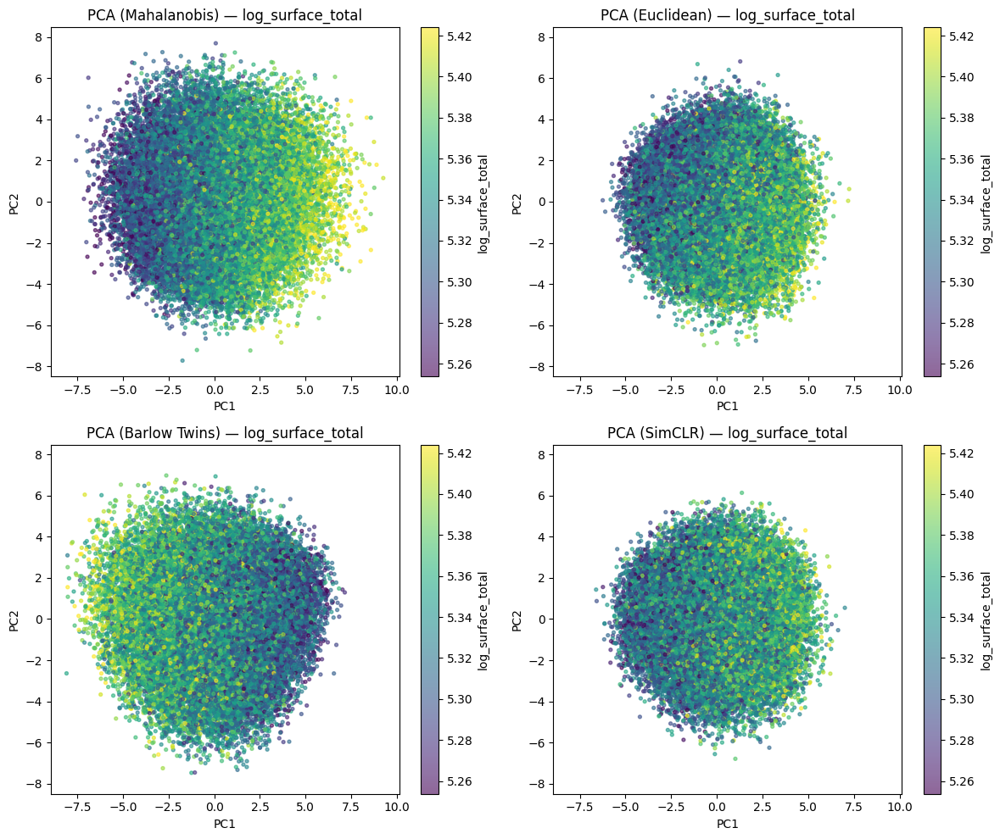

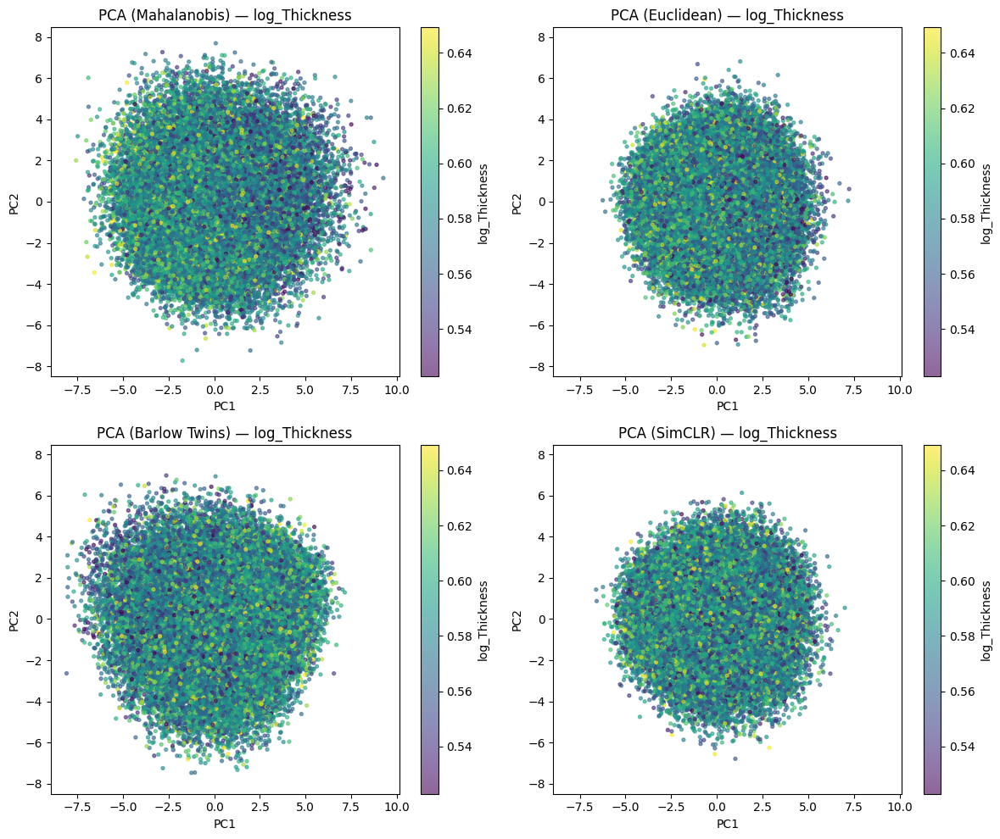

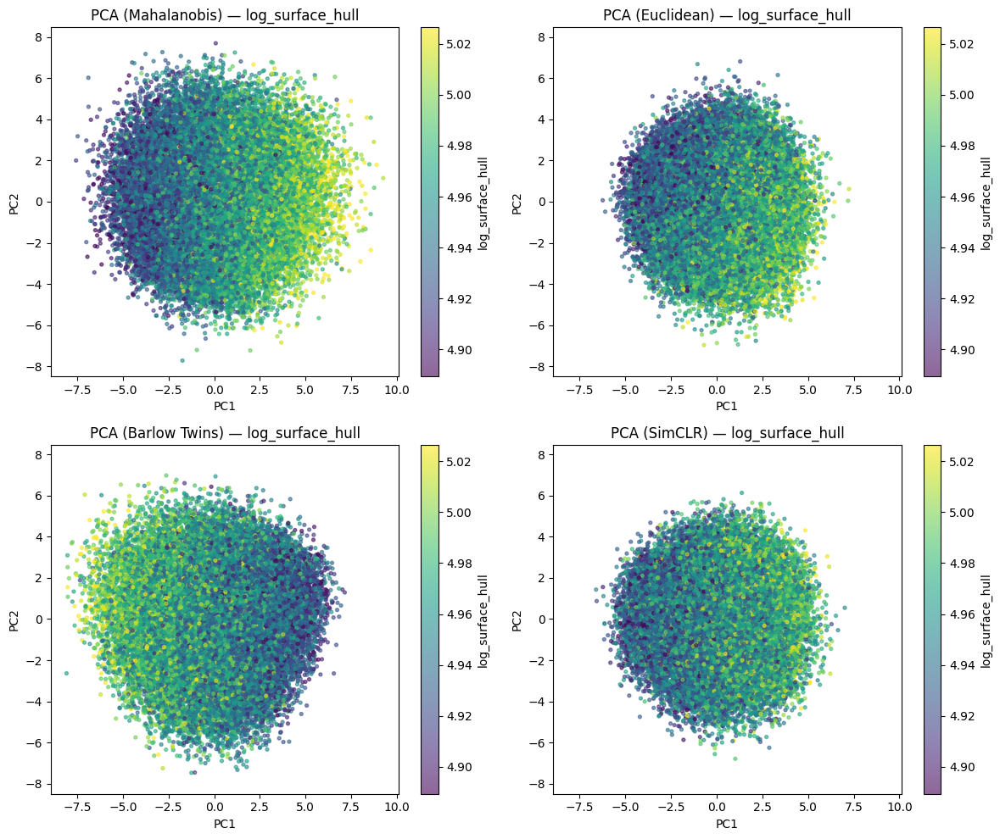

In [33]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# ========= Paths (edit if needed) =========
META_PATH = "/neurospin/dico/data/deep_folding/current/datasets/UkBioBank40/log_thickness_surface_Age.csv"
EMB_MAH_PATH = "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Output/surface/mahlonobis_16/OCCIPITAL_left_32_16/sigma_null_factor_1.2_batch_16/2025-08-03/19-01-53_0/ukb40_FCLp_no_classiffier_random_embeddings/full_embeddings.csv"
EMB_EUC_PATH = "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Output/surface/diagonal_16/OCCIPITAL_left_32_16/sigma_null_factor_1.0_batch_16/2025-08-02/18-27-08_0/ukb40_FCLp_no_classiffier_random_embeddings/full_embeddings.csv"
EMB_BT_PATH  = "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Output/BT/OCCIPITAL_left_32_32/batch_32_seed_128/2025-08-04/14-23-42_0/ukb40_FCLp_no_classiffier_random_embeddings/full_embeddings.csv"
EMB_SIMCLR_PATH = "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Output/SIMCLR/OCCIPITAL_left_32_16/batch_16_seed_128/2025-08-24/21-13-46_0/ukb40_FCLp_no_classiffier_random_embeddings/full_embeddings.csv"

META_COLS = ["log_surface_total", "log_Thickness", "log_surface_hull"]
ID_COL = None  # set to your exact ID column if you know it (e.g., "ID" or "eid")

# ========= Helpers =========
def guess_id_col(df, explicit=None):
    if explicit and explicit in df.columns:
        return explicit
    for c in ["ID","Id","id","subject","Subject","SUBJECT","eid","participant_id"]:
        if c in df.columns:
            return c
    raise KeyError(f"No ID column found. Available: {list(df.columns)}")

def load_embeddings(path, id_col=None):
    df = pd.read_csv(path)
    cid = guess_id_col(df, id_col)
    num_cols = [c for c in df.columns if c != cid and np.issubdtype(df[c].dtype, np.number)]
    if not num_cols:
        raise ValueError(f"No numeric embedding columns in {path}")
    return df[[cid] + num_cols].rename(columns={cid: "ID"})

def load_metadata(path, meta_cols, id_col=None):
    df = pd.read_csv(path)
    cid = guess_id_col(df, id_col)
    keep = [cid] + meta_cols
    missing = [c for c in meta_cols if c not in df.columns]
    if missing:
        raise KeyError(f"Missing {missing} in metadata. Available: {list(df.columns)}")
    return df[keep].rename(columns={cid: "ID"})

def pca2(emb, n_components=2, random_state=0):
    X = emb.drop(columns=["ID"]).values
    Xs = StandardScaler().fit_transform(X)
    p = PCA(n_components=n_components, random_state=random_state)
    Z = p.fit_transform(Xs)
    out = pd.DataFrame(Z, columns=[f"PC{i+1}" for i in range(n_components)])
    out.insert(0, "ID", emb["ID"].values)
    return out, p.explained_variance_ratio_

def robust_limits_across(dfs, meta_col, q_low=1, q_high=99):
    """Percentile-based limits across multiple dataframes for a shared color scale."""
    vals = np.concatenate([df[meta_col].to_numpy() for df in dfs])
    vmin = np.nanpercentile(vals, q_low)
    vmax = np.nanpercentile(vals, q_high)
    if np.isclose(vmin, vmax):
        eps = 1e-6
        vmin, vmax = vmin - eps, vmax + eps
    return float(vmin), float(vmax)

def shared_axis_limits(dfs, xcol="PC1", ycol="PC2", pad=0.05):
    x_all = np.concatenate([df[xcol].to_numpy() for df in dfs])
    y_all = np.concatenate([df[ycol].to_numpy() for df in dfs])
    xpad = pad * (x_all.max() - x_all.min() + 1e-9)
    ypad = pad * (y_all.max() - y_all.min() + 1e-9)
    return (x_all.min() - xpad, x_all.max() + xpad), (y_all.min() - ypad, y_all.max() + ypad)

# ========= Flexible multi-panel scatter (3 or 4 methods) =========
def multi_scatter(pcs, meta, meta_col, titles, s=8, alpha=0.6, cmap="viridis",
                  save_path=None, figsize=None):
    """
    pcs: list of PC dataframes (each has columns: ID, PC1, PC2)
    meta: metadata dataframe (ID + meta columns)
    titles: list of subplot titles (same order as pcs)
    """
    assert len(pcs) == len(titles), "pcs and titles length mismatch"

    # merge on common IDs for all methods
    dfs = [pc.merge(meta, on="ID", how="inner") for pc in pcs]
    common = set(dfs[0]["ID"])
    for df in dfs[1:]:
        common &= set(df["ID"])
    dfs = [df[df["ID"].isin(common)].reset_index(drop=True) for df in dfs]
    if any(len(df) == 0 for df in dfs):
        raise ValueError("No common IDs across methods and metadata after merging.")

    # shared color scale and axes
    vmin, vmax = robust_limits_across(dfs, meta_col)
    xlim, ylim = shared_axis_limits(dfs, "PC1", "PC2")

    # choose layout
    n = len(dfs)
    if n == 3:
        nrows, ncols = 1, 3
        if figsize is None:
            figsize = (15, 5)
    elif n == 4:
        nrows, ncols = 2, 2
        if figsize is None:
            figsize = (12, 10)
    else:
        # fallback to single row
        nrows, ncols = 1, n
        if figsize is None:
            figsize = (5*n, 5)

    fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
    axes = np.array(axes).reshape(-1)

    for ax, df, title in zip(axes, dfs, titles):
        sc = ax.scatter(df["PC1"], df["PC2"], c=np.clip(df[meta_col], vmin, vmax),
                        s=s, alpha=alpha, cmap=cmap, vmin=vmin, vmax=vmax)
        ax.set_xlabel("PC1")
        ax.set_ylabel("PC2")
        ax.set_title(f"PCA ({title}) — {meta_col}")
        ax.set_xlim(xlim)
        ax.set_ylim(ylim)
        cb = plt.colorbar(sc, ax=ax)
        cb.set_label(meta_col)

    # hide any unused axes (if any)
    for k in range(len(dfs), len(axes)):
        axes[k].axis("off")

    plt.tight_layout()
    if save_path:
        Path(save_path).parent.mkdir(parents=True, exist_ok=True)
        plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()

# ========= Load & run =========
meta_df = load_metadata(META_PATH, META_COLS, ID_COL)
emb_mah = load_embeddings(EMB_MAH_PATH, ID_COL)
emb_euc = load_embeddings(EMB_EUC_PATH, ID_COL)
emb_bt  = load_embeddings(EMB_BT_PATH,  ID_COL)
emb_sim = load_embeddings(EMB_SIMCLR_PATH, ID_COL)

pc_mah, evr_mah = pca2(emb_mah)
pc_euc, evr_euc = pca2(emb_euc)
pc_bt,  evr_bt  = pca2(emb_bt)
pc_sim, evr_sim = pca2(emb_sim)

print(f"Mahalanobis EVR: PC1={evr_mah[0]:.2f}, PC2={evr_mah[1]:.2f}")
print(f"Euclidean   EVR: PC1={evr_euc[0]:.2f}, PC2={evr_euc[1]:.2f}")
print(f"BarlowTwin  EVR: PC1={evr_bt[0]:.2f}, PC2={evr_bt[1]:.2f}")
print(f"SimCLR      EVR: PC1={evr_sim[0]:.2f}, PC2={evr_sim[1]:.2f}")

# === Plot 4 panels (Mahalanobis, Euclidean, Barlow Twins, SimCLR) ===
for mcol in META_COLS:
    multi_scatter(
        pcs=[pc_mah, pc_euc, pc_bt, pc_sim],
        meta=meta_df,
        meta_col=mcol,
        titles=("Mahalanobis", "Euclidean", "Barlow Twins", "SimCLR"),
        s=8, alpha=0.6,
        # save_path=f"pca_quads/PCA_{mcol}.png"  # <- uncomment to save
    )


In [ ]:
import pandas as pd
import numpy as np

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score

# -----------------------
# Paths & config
# -----------------------
META_PATH = "/neurospin/dico/data/deep_folding/current/datasets/UkBioBank40/log_thickness_surface_Age.csv"
EMB_PATHS = {
    "Mahalanobis": "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Output/surface/mahlonobis_16/OCCIPITAL_left_32_16/sigma_null_factor_1.2_batch_16/2025-08-03/19-01-53_0/ukb40_FCLp_no_classiffier_random_embeddings/full_embeddings.csv",
    "Euclidean":   "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Output/surface/diagonal_16/OCCIPITAL_left_32_16/sigma_null_factor_1.0_batch_16/2025-08-02/18-27-08_0/ukb40_FCLp_no_classiffier_random_embeddings/full_embeddings.csv",
    "BarlowTwins": "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Output/BT/OCCIPITAL_left_32_32/batch_32_seed_128/2025-08-04/14-23-42_0/ukb40_FCLp_no_classiffier_random_embeddings/full_embeddings.csv",
}
TARGETS = ["log_surface_total", "log_Thickness", "log_surface_hull"]

ID_COL = None  # leave None to auto-detect a shared ID column
RANDOM_STATE = 0
N_OUTER = 5

# -----------------------
# Utilities
# -----------------------
def guess_id_col(df, explicit=None):
    if explicit and explicit in df.columns:
        return explicit
    for c in ["ID","Id","id","subject","Subject","SUBJECT","eid","participant_id"]:
        if c in df.columns:
            return c
    raise KeyError(f"No ID column found. Available: {list(df.columns)}")

def load_metadata(path, targets, id_col=None):
    df = pd.read_csv(path)
    cid = guess_id_col(df, id_col)
    return df.rename(columns={cid: "ID"})[["ID"] + targets]

def load_embeddings(path, id_col=None):
    df = pd.read_csv(path)
    cid = guess_id_col(df, id_col)
    feat_cols = [c for c in df.columns if c != cid and np.issubdtype(df[c].dtype, np.number)]
    if not feat_cols:
        raise ValueError(f"No numeric embedding columns in {path}")
    return df.rename(columns={cid: "ID"})[["ID"] + feat_cols]

def pearson_r(y_true, y_pred):
    y_true = np.asarray(y_true).ravel()
    y_pred = np.asarray(y_pred).ravel()
    if y_true.std() == 0 or y_pred.std() == 0:
        return np.nan
    return np.corrcoef(y_true, y_pred)[0, 1]

def outer_cv_scores(X, y, model, n_splits=5, random_state=0):
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=random_state)
    rs, r2s, rmses = [], [], []
    for tr, te in kf.split(X):
        X_tr, X_te = X[tr], X[te]
        y_tr, y_te = y[tr], y[te]
        model.fit(X_tr, y_tr)
        y_hat = model.predict(X_te)
        rs.append(pearson_r(y_te, y_hat))
        r2s.append(r2_score(y_te, y_hat))
        # Manual RMSE (compatible with old sklearn)
        mse = mean_squared_error(y_te, y_hat)
        rmses.append(np.sqrt(mse))
    return {
        "r(mean)": float(np.nanmean(rs)),
        "R2(mean)": float(np.nanmean(r2s)),
        "RMSE(mean)": float(np.nanmean(rmses)),
    }

# -----------------------
# Fixed best ElasticNet params (from your search)
# -----------------------
best_params = {"alpha": 1e-4, "l1_ratio": 0.1}
model = Pipeline([
    ("scaler", StandardScaler()),
    ("reg", ElasticNet(random_state=RANDOM_STATE, max_iter=10000, **best_params))
])

# -----------------------
# Run comparison (Mahalanobis vs Euclidean)
# -----------------------
meta = load_metadata(META_PATH, TARGETS, ID_COL)
rows = []

for emb_name, emb_path in EMB_PATHS.items():
    emb = load_embeddings(emb_path, ID_COL)
    df = emb.merge(meta, on="ID", how="inner")
    if df.empty:
        raise ValueError(f"No overlapping IDs for {emb_name} and metadata.")

    # Features (all numeric embedding cols)
    X_all = df.drop(columns=["ID"] + TARGETS).values

    for target in TARGETS:
        y_all = df[target].astype(float).values
        # Drop NaN/inf in target
        mask = np.isfinite(y_all)
        n_drop = int((~mask).sum())
        if n_drop > 0:
            print(f"[{emb_name}] Dropping {n_drop} rows with invalid {target} (NaN/inf).")
        X, y = X_all[mask], y_all[mask]

        if len(y) < N_OUTER:
            print(f"⚠️ Skipping {target} for {emb_name}: only {len(y)} valid samples (< {N_OUTER}).")
            continue

        scores = outer_cv_scores(X, y, model, n_splits=N_OUTER, random_state=RANDOM_STATE)
        rows.append({
            "Embedding": emb_name,
            "Target": target,
            "r(mean)": round(scores["r(mean)"], 4),
            "R2(mean)": round(scores["R2(mean)"], 4),
            "RMSE(mean)": round(scores["RMSE(mean)"], 4),
            "N_used": len(y),
            "alpha": best_params["alpha"],
            "l1_ratio": best_params["l1_ratio"],
        })

results_df = pd.DataFrame(rows).sort_values(["Embedding","Target"]).reset_index(drop=True)
print(results_df)

# Optional: save/LaTeX
# results_df.to_csv("regression_resul_


[Mahalanobis] Dropping 14 rows with invalid log_surface_total (NaN/inf).
[Euclidean] Dropping 14 rows with invalid log_surface_total (NaN/inf).
     Embedding             Target  r(mean)  R2(mean)  RMSE(mean)  N_used  \
0    Euclidean      log_Thickness   0.0522    0.0023      0.0882   37713   
1    Euclidean   log_surface_hull   0.5629    0.3167      0.0252   37713   
2    Euclidean  log_surface_total   0.5577    0.3109      0.0315   37699   
3  Mahalanobis      log_Thickness   0.0684    0.0045      0.0881   37713   
4  Mahalanobis   log_surface_hull   0.6805    0.4630      0.0223   37713   
5  Mahalanobis  log_surface_total   0.7332    0.5375      0.0258   37699   

    alpha  l1_ratio  
0  0.0001       0.1  
1  0.0001       0.1  
2  0.0001       0.1  
3  0.0001       0.1  
4  0.0001       0.1  
5  0.0001       0.1  


In [15]:
import pandas as pd
import numpy as np

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score

# -----------------------
# Paths & config
# -----------------------
META_PATH = "/neurospin/dico/data/deep_folding/current/datasets/UkBioBank40/log_thickness_surface_Age.csv"
EMB_PATHS = {
    "Mahalanobis": "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Output/surface/mahlonobis_16/OCCIPITAL_left_32_16/sigma_null_factor_1.2_batch_16/2025-08-03/19-01-53_0/ukb40_FCLp_no_classiffier_random_embeddings/full_embeddings.csv",
    "Euclidean":   "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Output/surface/diagonal_16/OCCIPITAL_left_32_16/sigma_null_factor_1.0_batch_16/2025-08-02/18-27-08_0/ukb40_FCLp_no_classiffier_random_embeddings/full_embeddings.csv",
    "BarlowTwins": "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Output/BT/OCCIPITAL_left_32_32/batch_32_seed_128/2025-08-04/14-23-42_0/ukb40_FCLp_no_classiffier_random_embeddings/full_embeddings.csv",
}
TARGETS = ["log_surface_total", "log_Thickness", "log_surface_hull"]

ID_COL = None  # leave None to auto-detect a shared ID column
RANDOM_STATE = 0
N_OUTER = 5

# -----------------------
# Utilities
# -----------------------
def guess_id_col(df, explicit=None):
    if explicit and explicit in df.columns:
        return explicit
    for c in ["ID","Id","id","subject","Subject","SUBJECT","eid","participant_id"]:
        if c in df.columns:
            return c
    raise KeyError(f"No ID column found. Available: {list(df.columns)}")

def load_metadata(path, targets, id_col=None):
    df = pd.read_csv(path)
    cid = guess_id_col(df, id_col)
    return df.rename(columns={cid: "ID"})[["ID"] + targets]

def load_embeddings(path, id_col=None):
    df = pd.read_csv(path)
    cid = guess_id_col(df, id_col)
    feat_cols = [c for c in df.columns if c != cid and np.issubdtype(df[c].dtype, np.number)]
    if not feat_cols:
        raise ValueError(f"No numeric embedding columns in {path}")
    return df.rename(columns={cid: "ID"})[["ID"] + feat_cols]

def pearson_r(y_true, y_pred):
    y_true = np.asarray(y_true).ravel()
    y_pred = np.asarray(y_pred).ravel()
    if y_true.std() == 0 or y_pred.std() == 0:
        return np.nan
    return np.corrcoef(y_true, y_pred)[0, 1]

def outer_cv_scores(X, y, model, n_splits=5, random_state=0):
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=random_state)
    rs, r2s, rmses = [], [], []
    for tr, te in kf.split(X):
        X_tr, X_te = X[tr], X[te]
        y_tr, y_te = y[tr], y[te]
        model.fit(X_tr, y_tr)
        y_hat = model.predict(X_te)
        rs.append(pearson_r(y_te, y_hat))
        r2s.append(r2_score(y_te, y_hat))
        # Manual RMSE (compatible with old sklearn)
        mse = mean_squared_error(y_te, y_hat)
        rmses.append(np.sqrt(mse))
    return {
        "r(mean)": float(np.nanmean(rs)),
        "R2(mean)": float(np.nanmean(r2s)),
        "RMSE(mean)": float(np.nanmean(rmses)),
    }

# -----------------------
# Fixed best ElasticNet params (from your search)
# -----------------------
best_params = {"alpha": 1e-4, "l1_ratio": 0.1}
model = Pipeline([
    ("scaler", StandardScaler()),
    ("reg", ElasticNet(random_state=RANDOM_STATE, max_iter=10000, **best_params))
])

# -----------------------
# Run comparison (Mahalanobis vs Euclidean)
# -----------------------
meta = load_metadata(META_PATH, TARGETS, ID_COL)
rows = []

for emb_name, emb_path in EMB_PATHS.items():
    emb = load_embeddings(emb_path, ID_COL)
    df = emb.merge(meta, on="ID", how="inner")
    if df.empty:
        raise ValueError(f"No overlapping IDs for {emb_name} and metadata.")

    # Features (all numeric embedding cols)
    X_all = df.drop(columns=["ID"] + TARGETS).values

    for target in TARGETS:
        y_all = df[target].astype(float).values
        # Drop NaN/inf in target
        mask = np.isfinite(y_all)
        n_drop = int((~mask).sum())
        if n_drop > 0:
            print(f"[{emb_name}] Dropping {n_drop} rows with invalid {target} (NaN/inf).")
        X, y = X_all[mask], y_all[mask]

        if len(y) < N_OUTER:
            print(f"⚠️ Skipping {target} for {emb_name}: only {len(y)} valid samples (< {N_OUTER}).")
            continue

        scores = outer_cv_scores(X, y, model, n_splits=N_OUTER, random_state=RANDOM_STATE)
        rows.append({
            "Embedding": emb_name,
            "Target": target,
            "r(mean)": round(scores["r(mean)"], 4),
            "R2(mean)": round(scores["R2(mean)"], 4),
            "RMSE(mean)": round(scores["RMSE(mean)"], 4),
            "N_used": len(y),
            "alpha": best_params["alpha"],
            "l1_ratio": best_params["l1_ratio"],
        })

results_df = pd.DataFrame(rows).sort_values(["Embedding","Target"]).reset_index(drop=True)

# Create a pivot table: rows = (Target, Metric), cols = Embeddings
pivot_df = results_df.melt(
    id_vars=["Embedding","Target"],
    value_vars=["r(mean)", "R2(mean)", "RMSE(mean)"],
    var_name="Metric",
    value_name="Score"
)
pivot_table = pivot_df.pivot_table(
    index=["Target","Metric"],
    columns="Embedding",
    values="Score"
)

print("\n=== Comparison Table ===")
print(pivot_table)

# Optional: save/LaTeX
# results_df.to_csv("regression_resul_


[Mahalanobis] Dropping 14 rows with invalid log_surface_total (NaN/inf).
[Euclidean] Dropping 14 rows with invalid log_surface_total (NaN/inf).
[BarlowTwins] Dropping 14 rows with invalid log_surface_total (NaN/inf).

=== Comparison Table ===
Embedding                     BarlowTwins  Euclidean  Mahalanobis
Target            Metric                                         
log_Thickness     R2(mean)         0.0032     0.0023       0.0045
                  RMSE(mean)       0.0881     0.0882       0.0881
                  r(mean)          0.0584     0.0522       0.0684
log_surface_hull  R2(mean)         0.2813     0.3167       0.4630
                  RMSE(mean)       0.0258     0.0252       0.0223
                  r(mean)          0.5305     0.5629       0.6805
log_surface_total R2(mean)         0.2731     0.3109       0.5375
                  RMSE(mean)       0.0323     0.0315       0.0258
                  r(mean)          0.5228     0.5577       0.7332


In [32]:
import pandas as pd
import numpy as np

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score

# -----------------------
# Paths & config
# -----------------------
META_PATH = "/neurospin/dico/data/deep_folding/current/datasets/UkBioBank40/log_thickness_surface_Age.csv"

# Individual paths (easier to tweak)
EMB_MAH_PATH = "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Output/surface/mahlonobis_16/OCCIPITAL_left_32_16/sigma_null_factor_1.2_batch_16/2025-08-03/19-01-53_0/ukb40_FCLp_no_classiffier_random_embeddings/full_embeddings.csv"
EMB_EUC_PATH = "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Output/surface/diagonal_16/OCCIPITAL_left_32_16/sigma_null_factor_1.0_batch_16/2025-08-02/18-27-08_0/ukb40_FCLp_no_classiffier_random_embeddings/full_embeddings.csv"
EMB_BT_PATH  = "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Output/BT/OCCIPITAL_left_32_32/batch_32_seed_128/2025-08-04/14-23-42_0/ukb40_FCLp_no_classiffier_random_embeddings/full_embeddings.csv"
EMB_SIMCLR_PATH = "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Output/SIMCLR/OCCIPITAL_left_32_16/batch_16_seed_128/2025-08-24/21-13-46_0/ukb40_FCLp_no_classiffier_random_embeddings/full_embeddings.csv"

EMB_PATHS = {
    "Mahalanobis": EMB_MAH_PATH,
    "Euclidean":   EMB_EUC_PATH,
    "BarlowTwins": EMB_BT_PATH,
    "SimCLR":      EMB_SIMCLR_PATH,
}

TARGETS = ["log_surface_total", "log_Thickness", "log_surface_hull"]

ID_COL = None  # leave None to auto-detect a shared ID column
RANDOM_STATE = 0
N_OUTER = 5

# -----------------------
# Utilities
# -----------------------
def guess_id_col(df, explicit=None):
    if explicit and explicit in df.columns:
        return explicit
    for c in ["ID","Id","id","subject","Subject","SUBJECT","eid","participant_id"]:
        if c in df.columns:
            return c
    raise KeyError(f"No ID column found. Available: {list(df.columns)}")

def load_metadata(path, targets, id_col=None):
    df = pd.read_csv(path)
    cid = guess_id_col(df, id_col)
    return df.rename(columns={cid: "ID"})[["ID"] + targets]

def load_embeddings(path, id_col=None):
    df = pd.read_csv(path)
    cid = guess_id_col(df, id_col)
    feat_cols = [c for c in df.columns if c != cid and np.issubdtype(df[c].dtype, np.number)]
    if not feat_cols:
        raise ValueError(f"No numeric embedding columns in {path}")
    return df.rename(columns={cid: "ID"})[["ID"] + feat_cols]

def pearson_r(y_true, y_pred):
    y_true = np.asarray(y_true).ravel()
    y_pred = np.asarray(y_pred).ravel()
    if y_true.std() == 0 or y_pred.std() == 0:
        return np.nan
    return np.corrcoef(y_true, y_pred)[0, 1]

def outer_cv_scores(X, y, model, n_splits=5, random_state=0):
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=random_state)
    rs, r2s, rmses = [], [], []
    for tr, te in kf.split(X):
        X_tr, X_te = X[tr], X[te]
        y_tr, y_te = y[tr], y[te]
        model.fit(X_tr, y_tr)
        y_hat = model.predict(X_te)
        rs.append(pearson_r(y_te, y_hat))
        r2s.append(r2_score(y_te, y_hat))
        mse = mean_squared_error(y_te, y_hat)
        rmses.append(np.sqrt(mse))
    return {
        "r(mean)": float(np.nanmean(rs)),
        "R2(mean)": float(np.nanmean(r2s)),
        "RMSE(mean)": float(np.nanmean(rmses)),
    }

# -----------------------
# Fixed best ElasticNet params (from your search)
# -----------------------
best_params = {"alpha": 1e-4, "l1_ratio": 0.1}
model = Pipeline([
    ("scaler", StandardScaler()),
    ("reg", ElasticNet(random_state=RANDOM_STATE, max_iter=10000, **best_params))
])

# -----------------------
# Run comparison (Mahalanobis vs Euclidean vs BarlowTwins vs SimCLR)
# -----------------------
meta = load_metadata(META_PATH, TARGETS, ID_COL)
rows = []

for emb_name, emb_path in EMB_PATHS.items():
    emb = load_embeddings(emb_path, ID_COL)
    df = emb.merge(meta, on="ID", how="inner")
    if df.empty:
        raise ValueError(f"No overlapping IDs for {emb_name} and metadata.")

    # Features (all numeric embedding cols)
    X_all = df.drop(columns=["ID"] + TARGETS).values

    for target in TARGETS:
        y_all = df[target].astype(float).values
        # Drop NaN/inf in target
        mask = np.isfinite(y_all)
        n_drop = int((~mask).sum())
        if n_drop > 0:
            print(f"[{emb_name}] Dropping {n_drop} rows with invalid {target} (NaN/inf).")
        X, y = X_all[mask], y_all[mask]

        if len(y) < N_OUTER:
            print(f"⚠️ Skipping {target} for {emb_name}: only {len(y)} valid samples (< {N_OUTER}).")
            continue

        scores = outer_cv_scores(X, y, model, n_splits=N_OUTER, random_state=RANDOM_STATE)
        rows.append({
            "Embedding": emb_name,
            "Target": target,
            "r(mean)": round(scores["r(mean)"], 4),
            "R2(mean)": round(scores["R2(mean)"], 4),
            "RMSE(mean)": round(scores["RMSE(mean)"], 4),
            "N_used": len(y),
            "alpha": best_params["alpha"],
            "l1_ratio": best_params["l1_ratio"],
        })

results_df = pd.DataFrame(rows).sort_values(["Embedding","Target"]).reset_index(drop=True)
print(results_df)

# Optional: save/LaTeX
# results_df.to_csv("regression_results_occipital.csv", index=False)
# with open("regression_results_occipital.tex", "w") as f:
#     f.write(results_df.to_latex(index=False, float_format="%.4f"))


[Mahalanobis] Dropping 14 rows with invalid log_surface_total (NaN/inf).
[Euclidean] Dropping 14 rows with invalid log_surface_total (NaN/inf).
[BarlowTwins] Dropping 14 rows with invalid log_surface_total (NaN/inf).
[SimCLR] Dropping 14 rows with invalid log_surface_total (NaN/inf).
      Embedding             Target  r(mean)  R2(mean)  RMSE(mean)  N_used  \
0   BarlowTwins      log_Thickness   0.0584    0.0032      0.0881   37713   
1   BarlowTwins   log_surface_hull   0.5305    0.2813      0.0258   37713   
2   BarlowTwins  log_surface_total   0.5228    0.2731      0.0323   37699   
3     Euclidean      log_Thickness   0.0522    0.0023      0.0882   37713   
4     Euclidean   log_surface_hull   0.5629    0.3167      0.0252   37713   
5     Euclidean  log_surface_total   0.5577    0.3109      0.0315   37699   
6   Mahalanobis      log_Thickness   0.0684    0.0045      0.0881   37713   
7   Mahalanobis   log_surface_hull   0.6805    0.4630      0.0223   37713   
8   Mahalanobis  log_s

In [35]:
import pandas as pd

# Path to your CSV
csv_path = "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Program/2023_jlaval_STSbabies/abdelghani_scripts/confidence_predictions_FCLP.csv"

# Load CSV
df = pd.read_csv(csv_path)

# Modify ID column: add "NDAR" after "sub-"
df["ID"] = df["ID"].str.replace(r"^sub-", "sub-NDAR", regex=True)

# Save back to CSV (overwrite or save as new file)
df.to_csv(csv_path.replace(".csv", "_with_NDAR.csv"), index=False)

print("IDs updated and saved to:", csv_path.replace(".csv", "_with_NDAR.csv"))


IDs updated and saved to: /neurospin/dico/babdelghani/Runs/02_champollion_v1/Program/2023_jlaval_STSbabies/abdelghani_scripts/confidence_predictions_FCLP_with_NDAR.csv


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# ========= Paths (edit if needed) =========
META_PATH = "/neurospin/dico/data/deep_folding/current/datasets/UkBioBank40/log_thickness_surface_Age.csv"
EMB_MAH_PATH = "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Output/surface/mahlonobis_16/OCCIPITAL_left_32_16/sigma_null_factor_1.2_batch_16/2025-08-03/19-01-53_0/ukb40_FCLp_no_classiffier_random_embeddings/full_embeddings.csv"
EMB_EUC_PATH = "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Output/surface/diagonal_16/OCCIPITAL_left_32_16/sigma_null_factor_1.0_batch_16/2025-08-02/18-27-08_0/ukb40_FCLp_no_classiffier_random_embeddings/full_embeddings.csv"
EMB_BT_PATH  = "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Output/BT/OCCIPITAL_left_32_32/batch_32_seed_128/2025-08-04/14-23-42_0/ukb40_FCLp_no_classiffier_random_embeddings/full_embeddings.csv"
EMB_SIMCLR_PATH = "/neurospin/dico/babdelghani/Runs/02_champollion_v1/Output/SIMCLR/OCCIPITAL_left_32_16/batch_16_seed_128/2025-08-24/21-13-46_0/ukb40_FCLp_no_classiffier_random_embeddings/full_embeddings.csv"

META_COLS = ["log_surface_total", "log_Thickness", "log_surface_hull"]
ID_COL = None  # set to your exact ID column if you know it (e.g., "ID" or "eid")

# ========= Helpers =========
def guess_id_col(df, explicit=None):
    if explicit and explicit in df.columns:
        return explicit
    for c in ["ID","Id","id","subject","Subject","SUBJECT","eid","participant_id"]:
        if c in df.columns:
            return c
    raise KeyError(f"No ID column found. Available: {list(df.columns)}")

def load_embeddings(path, id_col=None):
    df = pd.read_csv(path)
    cid = guess_id_col(df, id_col)
    num_cols = [c for c in df.columns if c != cid and np.issubdtype(df[c].dtype, np.number)]
    if not num_cols:
        raise ValueError(f"No numeric embedding columns in {path}")
    return df[[cid] + num_cols].rename(columns={cid: "ID"})

def load_metadata(path, meta_cols, id_col=None):
    df = pd.read_csv(path)
    cid = guess_id_col(df, id_col)
    keep = [cid] + meta_cols
    missing = [c for c in meta_cols if c not in df.columns]
    if missing:
        raise KeyError(f"Missing {missing} in metadata. Available: {list(df.columns)}")
    return df[keep].rename(columns={cid: "ID"})

def pca2(emb, n_components=2, random_state=0):
    X = emb.drop(columns=["ID"]).values
    Xs = StandardScaler().fit_transform(X)
    p = PCA(n_components=n_components, random_state=random_state)
    Z = p.fit_transform(Xs)
    out = pd.DataFrame(Z, columns=[f"PC{i+1}" for i in range(n_components)])
    out.insert(0, "ID", emb["ID"].values)
    return out, p.explained_variance_ratio_

def robust_limits_across(dfs, meta_col, q_low=1, q_high=99):
    vals = np.concatenate([df[meta_col].to_numpy() for df in dfs])
    vmin = np.nanpercentile(vals, q_low)
    vmax = np.nanpercentile(vals, q_high)
    if np.isclose(vmin, vmax):
        eps = 1e-6
        vmin, vmax = vmin - eps, vmax + eps
    return float(vmin), float(vmax)

def shared_axis_limits(dfs, xcol="PC1", ycol="PC2", pad=0.05):
    x_all = np.concatenate([df[xcol].to_numpy() for df in dfs])
    y_all = np.concatenate([df[ycol].to_numpy() for df in dfs])
    xpad = pad * (x_all.max() - x_all.min() + 1e-9)
    ypad = pad * (y_all.max() - y_all.min() + 1e-9)
    return (x_all.min() - xpad, x_all.max() + xpad), (y_all.min() - ypad, y_all.max() + ypad)

### NEW: intersection of IDs across all PC frames + meta
def common_ids(pcs, meta):
    ids = set(meta["ID"])
    for pc in pcs:
        ids &= set(pc["ID"])
    return ids

### NEW: stratified sampling on a continuous metadata column (quantile bins)
def stratified_ids_on_meta(meta_df, meta_col, target_n=3000, n_bins=20, random_state=0):
    rng = np.random.default_rng(random_state)
    df = meta_df[["ID", meta_col]].dropna().copy()

    # build quantile bins; fallback to fewer bins if duplicates
    for nb in range(n_bins, 1, -1):
        qs = np.linspace(0, 1, nb + 1)
        bins = np.unique(np.quantile(df[meta_col], qs))
        if len(bins) > 2:  # need at least 3 edges for 2 bins
            break
    df["bin"] = pd.cut(df[meta_col], bins=bins, include_lowest=True, labels=False)

    groups = df.dropna(subset=["bin"]).groupby("bin")
    n_bins_eff = groups.ngroups
    if n_bins_eff == 0:
        # no bins possible; just random sample
        take = min(target_n, len(df))
        return set(rng.choice(df["ID"].to_numpy(), size=take, replace=False))

    per_bin = max(1, target_n // n_bins_eff)
    chosen = []
    for _, g in groups:
        k = min(per_bin, len(g))
        if k > 0:
            chosen.extend(rng.choice(g["ID"].to_numpy(), size=k, replace=False).tolist())

    # top up to target_n if needed
    remaining_pool = list(set(df["ID"]) - set(chosen))
    need = min(target_n - len(chosen), len(remaining_pool))
    if need > 0:
        chosen += rng.choice(remaining_pool, size=need, replace=False).tolist()
    return set(chosen)

# ========= Flexible multi-panel scatter (3 or 4 methods) =========
def multi_scatter(pcs, meta, meta_col, titles, s=8, alpha=0.6, cmap="viridis",
                  save_path=None, figsize=None, id_subset=None):   # ### NEW id_subset
    """
    pcs: list of PC dataframes (each has columns: ID, PC1, PC2)
    meta: metadata dataframe (ID + meta columns)
    titles: list of subplot titles (same order as pcs)
    id_subset: optional set/list of IDs to keep (e.g., stratified 3k)
    """
    assert len(pcs) == len(titles), "pcs and titles length mismatch"

    # merge on common IDs for all methods
    dfs = [pc.merge(meta, on="ID", how="inner") for pc in pcs]

    # keep only IDs common to all panels
    common = set(dfs[0]["ID"])
    for df in dfs[1:]:
        common &= set(df["ID"])

    # if a subset is passed, intersect with it
    if id_subset is not None:
        common &= set(id_subset)

    dfs = [df[df["ID"].isin(common)].reset_index(drop=True) for df in dfs]
    if any(len(df) == 0 for df in dfs):
        raise ValueError("No common IDs across methods/metadata after sampling/merging.")

    # shared color scale and axes
    vmin, vmax = robust_limits_across(dfs, meta_col)
    xlim, ylim = shared_axis_limits(dfs, "PC1", "PC2")

    # layout
    n = len(dfs)
    if n == 3:
        nrows, ncols = 1, 3
        if figsize is None: figsize = (15, 5)
    elif n == 4:
        nrows, ncols = 2, 2
        if figsize is None: figsize = (12, 10)
    else:
        nrows, ncols = 1, n
        if figsize is None: figsize = (5*n, 5)

    fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
    axes = np.array(axes).reshape(-1)

    for ax, df, title in zip(axes, dfs, titles):
        sc = ax.scatter(df["PC1"], df["PC2"],
                        c=np.clip(df[meta_col], vmin, vmax),
                        s=s, alpha=alpha, cmap=cmap, vmin=vmin, vmax=vmax)
        ax.set_xlabel("PC1"); ax.set_ylabel("PC2")
        ax.set_title(f"PCA ({title}) — {meta_col}  (n={len(df)})")
        ax.set_xlim(xlim); ax.set_ylim(ylim)
        cb = plt.colorbar(sc, ax=ax); cb.set_label(meta_col)

    # hide any unused axes
    for k in range(len(dfs), len(axes)):
        axes[k].axis("off")

    plt.tight_layout()
    if save_path:
        Path(save_path).parent.mkdir(parents=True, exist_ok=True)
        plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()

# ========= Load & run =========
meta_df = load_metadata(META_PATH, META_COLS, ID_COL)
emb_mah = load_embeddings(EMB_MAH_PATH, ID_COL)
emb_euc = load_embeddings(EMB_EUC_PATH, ID_COL)
emb_bt  = load_embeddings(EMB_BT_PATH,  ID_COL)
emb_sim = load_embeddings(EMB_SIMCLR_PATH, ID_COL)

pc_mah, evr_mah = pca2(emb_mah)
pc_euc, evr_euc = pca2(emb_euc)
pc_bt,  evr_bt  = pca2(emb_bt)
pc_sim, evr_sim = pca2(emb_sim)

print(f"Mahalanobis EVR: PC1={evr_mah[0]:.2f}, PC2={evr_mah[1]:.2f}")
print(f"Euclidean   EVR: PC1={evr_euc[0]:.2f}, PC2={evr_euc[1]:.2f}")
print(f"BarlowTwin  EVR: PC1={evr_bt[0]:.2f}, PC2={evr_bt[1]:.2f}")
print(f"SimCLR      EVR: PC1={evr_sim[0]:.2f}, PC2={evr_sim[1]:.2f}")

# IDs common to all four embeddings + metadata (for fair comparisons)
ids_all = common_ids([pc_mah, pc_euc, pc_bt, pc_sim], meta_df)

# === Plot 4 panels with stratified n=3000 on the metadata being plotted ===
TARGET_N = 3000
for mcol in META_COLS:
    # restrict metadata to common IDs first
    meta_common = meta_df[meta_df["ID"].isin(ids_all)].reset_index(drop=True)
    # stratified sample on the current metadata column
    sampled_ids = stratified_ids_on_meta(meta_common, mcol, target_n=TARGET_N, n_bins=20, random_state=42)

    multi_scatter(
        pcs=[pc_mah, pc_euc, pc_bt, pc_sim],
        meta=meta_common,
        meta_col=mcol,
        titles=("Mahalanobis", "Euclidean", "Barlow Twins", "SimCLR"),
        s=8, alpha=0.6,
        # save_path=f"pca_quads/PCA_{mcol}_n{TARGET_N}.png",
        id_subset=sampled_ids,            # <<< stratified 3k per meta
    )


ModuleNotFoundError: No module named 'pandas'